In [ ]:
!pip install tensorflow --upgrade
!pip install keras --upgrade

# **Downloading Kaggle Dataset**

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
alessandrasala79_ai_vs_human_generated_dataset_path = kagglehub.dataset_download('alessandrasala79/ai-vs-human-generated-dataset')

print('Data source import complete.')


Data source import complete.


In [ ]:
alessandrasala79_ai_vs_human_generated_dataset_path = alessandrasala79_ai_vs_human_generated_dataset_path + '/'

Dataset_Path = alessandrasala79_ai_vs_human_generated_dataset_path

# **Imports**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import shutil
import os
import glob
import shutil
import csv
import random as rn
import time

import tensorflow as tf
import keras
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, ConfusionMatrixDisplay, roc_auc_score, accuracy_score, f1_score, balanced_accuracy_score, fbeta_score, confusion_matrix, classification_report
from sklearn.metrics import RocCurveDisplay, roc_curve, PrecisionRecallDisplay, precision_recall_curve, average_precision_score, det_curve, DetCurveDisplay

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras import layers , models, optimizers, Model
from keras.models import Sequential, Model
from keras.layers import *
from keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

In [ ]:
def set_reproducible_seed(seed=0):
    """
    Set random seeds and configure TensorFlow for reproducible behavior.
    """
    # Ensure reproducible hashing
    os.environ['PYTHONHASHSEED'] = str(seed)

    # Set seeds for Python, NumPy, and TensorFlow
    rn.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    keras.utils.set_random_seed(seed)

    # Enable operation-level determinism (TF 2.9+)
    tf.config.experimental.enable_op_determinism()

    # Force deterministic GPU behavior where possible
    os.environ["TF_DETERMINISTIC_OPS"] = "1"
    os.environ["TF_CUDNN_DETERMINISTIC"] = "1"

    # Limit potential multithreading variability
    os.environ["OMP_NUM_THREADS"] = "1"
    os.environ["TF_NUM_INTEROP_THREADS"] = "1"
    os.environ["TF_NUM_INTRAOP_THREADS"] = "1"

    print(f"Random seed set to: {seed}")

# Set the seed (do this at the very beginning of your script)
set_reproducible_seed(0)

Random seed set to: 0


In [ ]:
Classes_Labels = ['Human', 'AI'] # Human = 0, AI = 1

## **Utility Functions**

In [ ]:
def show_class_images(df, label, rows=2, cols=5, image_column="file_name", title=""):
    """
    Display images from a specific class in a grid format.
    """

    # Get list of image paths for the given class
    image_paths = df[df["label"] == label][image_column].tolist()

    if len(image_paths) == 0:
        print(f"No images found for label: {label}")
        return

    total_images = rows * cols  # Calculate the total number of images to display
    selected_images = rn.sample(image_paths, min(total_images, len(image_paths)))  # Ensure we don’t exceed available images

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, img_path in enumerate(selected_images):
        img = Image.open(img_path)  # Open image
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
def show_test_images(df, rows=2, cols=5, image_column="file_path", title="Test Images"):
    """
    Display a grid of test images in a grid format.
    """

    total_images = rows * cols
    # Randomly sample image file paths from the dataframe
    sample_images = rn.sample(df[image_column].tolist(), min(total_images, len(df)))

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, img_path in enumerate(sample_images):
        img = Image.open(img_path)  # Open image

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Test Image {i + 1}")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
def compare_classes_images(df, rows=5, image_column="file_name", title="AI vs Human-Generated Images"):
    """
    Display classes images side by side in two aligned columns.
    """

    # Separate AI-generated and human-created images
    ai_images = df[df["label"] == 1][image_column].tolist()
    human_images = df[df["label"] == 0][image_column].tolist()

    # Determine the number of image pairs to display
    num_pairs = min(rows, len(ai_images), len(human_images))  # Ensure enough images exist

    if num_pairs == 0:
        print("Not enough images available for both classes.")
        return

    # Randomly sample images for comparison
    ai_sample = rn.sample(ai_images, num_pairs)
    human_sample = rn.sample(human_images, num_pairs)

    # Create the figure
    fig, axes = plt.subplots(nrows=num_pairs, ncols=2, figsize=(10, num_pairs * 3))

    for i in range(num_pairs):
        # Human-created image (Left Column)
        img_human = Image.open(human_sample[i])
        axes[i, 0].imshow(img_human)
        axes[i, 0].axis("off")
        axes[i, 0].set_title("Human-Generated", fontsize=12)

        # AI-generated image (Right Column)
        img_ai = Image.open(ai_sample[i])
        axes[i, 1].imshow(img_ai)
        axes[i, 1].axis("off")
        axes[i, 1].set_title("AI-Generated", fontsize=12)

    # Set overall title
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
def make_classification_plots(y_true, model_preds_probs, threshold, title):

  plt.style.use('default')
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  # 1 : Summary Metrics
  accuracy = accuracy_score(y_true, model_preds) # % positive out of all predicted positives
  balanced_accuracy = balanced_accuracy_score(y_true, model_preds)
  precision = precision_score(y_true, model_preds, average='weighted') # % positive out of all predicted positives
  recall =  recall_score(y_true, model_preds, average='weighted') # % positive out of all supposed to be positives
  f1 = f1_score(y_true, model_preds, average='weighted')
  fbeta = fbeta_score(y_true, model_preds, average='weighted', beta=2)
  auc = roc_auc_score(y_true, model_preds_probs)
  avgPR = average_precision_score(y_true, model_preds_probs)
  stats_summary = '[Metrics Summary]\nAccuracy = {:.2%} | Balanced Accuracy = {:.2%} | Precision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%} | F-Beta Score = {:.2%} | AUC Score = {:.2%} | Average Precision = {:.2%}'.format(accuracy, balanced_accuracy , precision, recall, f1, fbeta, auc, avgPR)
  print(stats_summary)

  # 2 : Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_true, model_preds, ax=axes[0])
  axes[0].set_title("Confusion Matrix")
  axes[0].set_xticklabels(Classes_Labels)
  axes[0].set_yticklabels(Classes_Labels)

  # 3 : Normalized Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_true, model_preds, ax=axes[1], normalize="true", values_format=".0%")
  axes[1].set_title("Normalized Confusion Matrix")

  # 4 : Classification Report
  class_report_df = classification_report(y_true, model_preds, target_names=Classes_Labels, output_dict=True)
  class_report_df = pd.DataFrame(class_report_df).T
  class_report_df['support'] = class_report_df['support'].astype(int)
  class_report_df.drop(index='accuracy', inplace=True)
  class_report_df[['precision', 'recall', 'f1-score']] = round(class_report_df[['precision', 'recall', 'f1-score']] * 100,2)
  sns.heatmap(class_report_df, annot=True, fmt=".2f", cmap=sns.color_palette("crest", as_cmap=True), annot_kws={"size": 12},
            linewidths= 1, square=True, ax = axes[2],
            )
  plt.yticks(rotation=0)
  axes[2].set_title("Classification Report")


  fig.suptitle(f"{title} Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  class_report = classification_report(y_true, model_preds, target_names= Classes_Labels)
  print('\n', f"{title} Classification Report: \n {class_report}")


  plt.style.use('ggplot')

In [ ]:
epsilon = np.finfo(np.float32).eps

def make_binary_classification_plots(y_true, model_preds_probs, threshold, title):

  # 1 : Summary Metrics
  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  precision = precision_score(y_true, model_preds)
  recall =  recall_score(y_true, model_preds)
  f1 = f1_score(y_true, model_preds)
  fbeta = fbeta_score(y_true, model_preds, beta=2)
  auc = roc_auc_score(y_true, model_preds_probs, average='micro')
  stats_summary = '[Positive Class Metrics Summary]\nPrecision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%} | F-Beta Score = {:.2%} | AUC Micro Score = {:.2%}'.format(precision, recall, f1, fbeta, auc)
  print(stats_summary)

  plt.style.use('ggplot')
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # 1 : ROC CURVE
  axes[0].plot([0, 1], [0, 1], 'k--')
  fpr, tpr, thresholds = roc_curve(y_true, model_preds_probs, pos_label=1)
  aucMacro = roc_auc_score(y_true, model_preds_probs)
  aucWeighted = roc_auc_score(y_true, model_preds_probs, average='weighted')
  axes[0].plot(fpr, tpr, color='orange', label=f'(AUC Macro = {round(aucMacro*100,2)}%)')
  axes[0].plot(fpr, tpr, '--', color='orange', label=f'(AUC Weighted = {round(aucWeighted*100,2)}%)')
  axes[0].set_title('ROC Curve')
  axes[0].set_xlabel('False Positive Rate', size=14)
  axes[0].set_ylabel('True Positive Rate', size=14)
  axes[0].legend(loc='best')

  # 2 : Precision Recall Curve
  precisions, recalls, thresholds = precision_recall_curve(y_true, model_preds_probs)
  avgPR = average_precision_score(y_true, model_preds_probs)
  # Plot the PR curve
  axes[1].plot(recalls, precisions, color='b', label='Binary PR Curve')
  axes[1].fill_between(recalls, precisions, alpha=0.2, color='b')
  axes[1].hlines(avgPR, 0, 1.0, "r", "dotted", label=f"(Avg PR = {round(avgPR*100,2)}%)")
  # Find the index of the threshold that gives the best precision-recall balance
  f1score = 2 * (precisions * recalls) / (precisions + recalls + epsilon)
  best_f1_idx = np.argmax(f1score)
  best_precision = precisions[best_f1_idx]
  best_recall = recalls[best_f1_idx]
  best_threshold = thresholds[best_f1_idx]
  # Draw the point for the best precision and recall
  axes[1].scatter(best_recall, best_precision, color='orange', marker='v', s=50, zorder=10,
                  label=f'Tradeoff Threshold = {round(best_threshold*100,2)}%\n Precision = {round(best_precision*100,2)}%, Recall = {round(best_recall*100,2)}%')
  axes[1].set_xlabel('Recall', size=14)
  axes[1].set_ylabel('Precision', size=14)
  axes[1].set_title("Precision Recall Curve")
  axes[1].legend(loc='best')

  # 3 : Decision Threshold
  axes[2].plot(thresholds, f1score[:-1], "g-", label="F1", linewidth=2, alpha=0.5)
  axes[2].plot(thresholds, precisions[:-1], "b-", label="Precision", linewidth=2, alpha=0.5)
  axes[2].plot(thresholds, recalls[:-1], "--", color='orange', label="Recall",linewidth=2)
  axes[2].vlines(threshold, 0, 1.0, "k", "dotted", label="Threshold")
  axes[2].vlines(best_threshold, 0, 1.0, "r", "dotted", label="Tradeoff Threshold")
  axes[2].set_xlabel('Threshold', size=14)
  axes[2].legend(loc='best')
  axes[2].set_title('Decision Threshold')

  fig.suptitle(f"{title} Binary Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  plt.style.use('default')

  return best_threshold

In [ ]:
def make_binary_threshold_plots(y_true, model_preds_probs, threshold, title):

  # 1 : Summary Metrics
  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  weightsMetrics = ['samples', 'micro', 'macro', 'weighted']
  aucScores = []
  avgPrScores = []

  for weight in weightsMetrics:
    aucScores.append(round((roc_auc_score(y_true, model_preds_probs, average=weight)*100),2))
    avgPrScores.append(round((average_precision_score(y_true, model_preds_probs, average=weight)*100),2))

  results_df = pd.DataFrame([aucScores,avgPrScores], columns=weightsMetrics, index = ['AUC','mAP'])
  display(results_df.style.background_gradient(cmap='Blues',axis=1))

  plt.style.use('ggplot')
  fig, axes = plt.subplots(1, 2, figsize=(15, 6))

  # 2 : Decision Threshold

  def f_beta_score(precision, recall, beta = 2):
    numerator = (1 + beta**2) * (precision * recall)
    denominator = (beta**2 * precision) + recall + epsilon
    f_beta = numerator / denominator
    return f_beta

  # Find the index of the threshold that gives the best precision-recall balance
  precisions, recalls, thresholds = precision_recall_curve(y_true, model_preds_probs)
  fbeta = f_beta_score(precisions, recalls, beta=2)
  best_fbeta_idx = np.argmax(fbeta)
  best_precision = precisions[best_fbeta_idx]
  best_recall = recalls[best_fbeta_idx]
  best_threshold = thresholds[best_fbeta_idx]

  axes[0].plot(thresholds, fbeta[:-1], "g-", label="F2-Beta Score", linewidth=2, alpha=0.5)
  axes[0].plot(thresholds, precisions[:-1], "b-", label="Precision", linewidth=2, alpha=0.5)
  axes[0].plot(thresholds, recalls[:-1], "--", color='orange', label="Recall",linewidth=2)
  axes[0].vlines(threshold, 0, 1.0, "k", "dotted", label="Threshold")
  axes[0].vlines(best_threshold, 0, 1.0, "r", "dotted", label="Tradeoff Threshold")
  axes[0].set_xlabel('Threshold', size=14)
  axes[0].legend(loc='best')
  axes[0].set_title(f'Recall Tradeoff Threshold = {round(best_threshold*100,2)}%\n Precision = {round(best_precision*100,2)}%, Recall = {round(best_recall*100,2)}%')


  # 3 : Detection Error Tradeoff
  fpr, fnr, _ = det_curve(y_true, model_preds_probs)
  DetCurveDisplay.from_predictions(y_true, model_preds_probs, ax=axes[1], name=title)
  axes[1].set_title("Detection Error Tradeoff")

  fig.suptitle(f"{title} Decision Threshold Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  plt.style.use('default')

  return best_threshold

In [ ]:
def plot_history_curves(history):
  """
  Plot Model Accuracy and Loss History during Training.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  plt.figure(figsize=(15,5))
  plt.style.use('ggplot')

  #plot loss
  plt.subplot(1, 2, 1)
  plt.plot(epochs, loss, 'bo-' , label = "TrainL oss")
  plt.plot(epochs, val_loss, 'o-' , color='orange', label = "Val Loss")
  plt.title("Loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.subplot(1, 2, 2)
  plt.plot(epochs, accuracy, 'bo-' , label = "Train Acc")
  plt.plot(epochs, val_accuracy, 'o-' , color='orange' , label = "Val Acc")
  plt.title("Accuracy")
  plt.xlabel("epochs")
  plt.legend()

  plt.style.use('default')

  #plt.tight_layout()

In [ ]:
def display_random_predictions(test_generator, source_test_generator, model, Classes_Labels, rows=2, cols=5, decision_threshold=0.5):
    """
    Display a grid of randomly selected images from a random batch of the test generator with their true and predicted labels,
    confidence percentages, and inference time for each image. and total infrence time for all images.
    """
    total_images = rows * cols

    # Randomly select a batch from the test generator.
    random_batch_index = np.random.randint(0, len(test_generator))

    batch_images, batch_labels = test_generator[random_batch_index]

    batch_source_images, batch_source_labels = source_test_generator[random_batch_index]

    # Randomly select total_images indices from that batch without replacement.
    random_img_indices = np.random.choice(batch_images.shape[0], total_images, replace=False)

    # Create subplots grid.
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 3, rows * 4),
                             subplot_kw={'xticks': [], 'yticks': []})
    axes = axes.flatten()

    total_inference_time = 0.0

    for i, ax in enumerate(axes):
        # Retrieve the image and its true label.
        random_img = batch_images[random_img_indices[i]]
        random_source_img = batch_source_images[random_img_indices[i]]
        true_label = int(batch_labels[random_img_indices[i]])

        # Measure inference time.
        start_time = time.perf_counter()
        pred_prob = model.predict(tf.expand_dims(random_img, axis=0), verbose=0)
        end_time = time.perf_counter()
        inference_time = end_time - start_time  # in seconds
        total_inference_time += inference_time

        # Use decision threshold for binary classification.
        if pred_prob[0][0] >= decision_threshold:
            predicted_label = 1
            confidence = pred_prob[0][0] * 100
        else:
            predicted_label = 0
            confidence = (1 - pred_prob[0][0]) * 100

        # Format the confidence to two decimal places.
        confidence_str = f"{confidence:.2f}"
        # Convert inference time to milliseconds for display.
        inference_time_ms = inference_time * 1000

        # Create a predictions map for printing.
        predictions_map = {
            Classes_Labels[0]: f"{(1 - pred_prob[0][0]) * 100:.2f}",
            Classes_Labels[1]: f"{pred_prob[0][0] * 100:.2f}"
        }

        true_class = Classes_Labels[true_label]
        pred_class = Classes_Labels[predicted_label]
        color = "green" if true_class == pred_class else "red"

        ax.imshow(random_source_img)
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence_str}%", color=color)
        print(f"Image {i+1} predictions: {predictions_map} | Inference Time: {inference_time_ms:.2f}ms")

    plt.tight_layout()
    plt.show()

    avg_infrence_time = total_inference_time / total_images

    print(f"\nTotal inference time for {total_images} images: {total_inference_time:.2f} seconds.")
    print(f"\nAverage inference time for {total_images} images: {avg_infrence_time:.2f} seconds ({(avg_infrence_time) * 1000:.2f}ms).")

In [ ]:
def custom_fairness_loss(alpha, beta):
    """
    Returns a loss function that combines binary cross-entropy with an MSE penalty
    to enforce a target ratio (beta) of predicted class 1.

    Parameters:
      - alpha: Weight for the fairness constraint (MSE term).
      - beta: Target ratio (desired average probability for class 1).

    The loss for a batch is computed as:
      Total Loss = Mean(Binary Cross-Entropy Loss) + alpha * (mean(y_pred) - beta)^2
    """
    def loss_fn(y_true, y_pred):
        # Compute the standard binary cross-entropy loss.
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        bce_mean = tf.reduce_mean(bce)

        # Compute the mean predicted probability for class 1 over the batch.
        mean_pred = tf.reduce_mean(y_pred)

        # Compute the fairness penalty as MSE between mean_pred and target beta.
        mse = tf.square(mean_pred - beta)

        # Total loss is the sum of the BCE loss and the weighted fairness penalty.
        total_loss = bce_mean + alpha * mse
        return total_loss
    return loss_fn


# Setting hyperparameters for the loss:
alpha = 1.0  # Weight for fairness constraint; adjust based on validation experiments.
beta = 0.5   # Target ratio; e.g., you want about 50% of predictions to be class 1.

# **Data Exploration**

### **Exploring CSV Files**

In [ ]:
comp_train_df = pd.read_csv(Dataset_Path + "train.csv")

comp_train_df["file_name"] = Dataset_Path + comp_train_df["file_name"]

comp_train_df.head()

,Unnamed: 0,file_name,label
0,0,/kaggle/input/ai-vs-human-generated-dataset/tr...,1
1,1,/kaggle/input/ai-vs-human-generated-dataset/tr...,0
2,2,/kaggle/input/ai-vs-human-generated-dataset/tr...,1
3,3,/kaggle/input/ai-vs-human-generated-dataset/tr...,0
4,4,/kaggle/input/ai-vs-human-generated-dataset/tr...,1


In [ ]:
comp_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79950 entries, 0 to 79949
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  79950 non-null  int64 
 1   file_name   79950 non-null  object
 2   label       79950 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 1.8+ MB


In [ ]:
comp_train_df=comp_train_df.drop('Unnamed: 0',axis=1)

> **Check if the training files exist**

In [ ]:
missing_files = comp_train_df[~comp_train_df["file_name"].apply(os.path.exists)]
print(f"Missing train images: {len(missing_files)}")

Missing train images: 0


In [ ]:
px.histogram(comp_train_df, y="label", color="label", title="Classes Distribution")

### **Visualizing Classes**

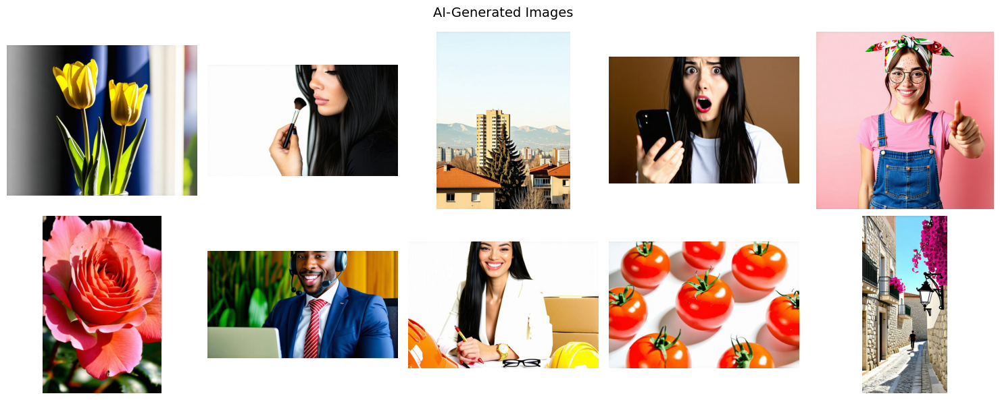

In [ ]:
# Show Random AI-generated images
show_class_images(comp_train_df, label=1, rows=2, cols=5, title="AI-Generated Images")

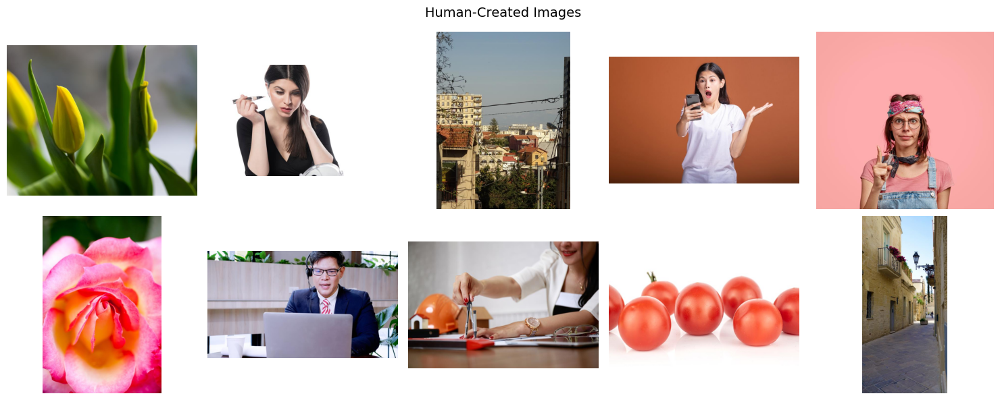

In [ ]:
# Show Random Human-created images
show_class_images(comp_train_df, label=0, rows=2, cols=5, title="Human-Created Images")

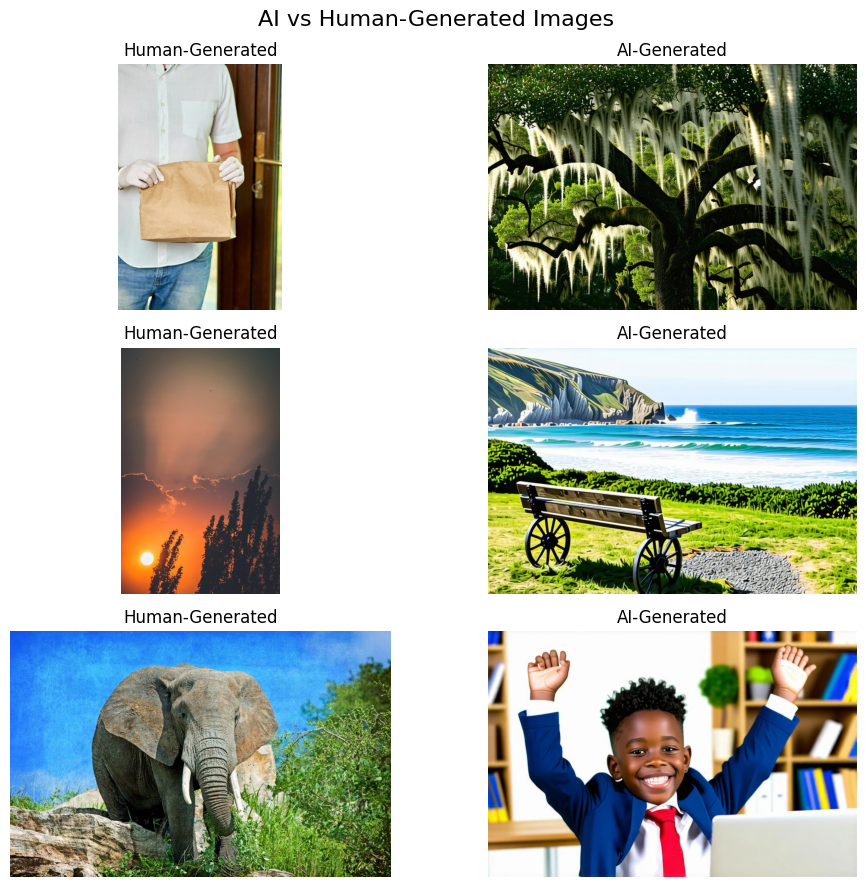

In [ ]:
compare_classes_images(comp_train_df, rows=3, title="AI vs Human-Generated Images")

### **Reading Test File**

In [ ]:
Comp_test_df = pd.read_csv(Dataset_Path + "test.csv")


Comp_test_df["file_path"] = Dataset_Path + Comp_test_df["id"]


Comp_test_df.head()

,id,file_path
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...


>**Check if test files exists**

In [ ]:
missing_files = Comp_test_df[~Comp_test_df["file_path"].apply(os.path.exists)]

print(f"Missing Test Images: {len(missing_files)}")

Missing Test Images: 0


> **Exploring Test Images**

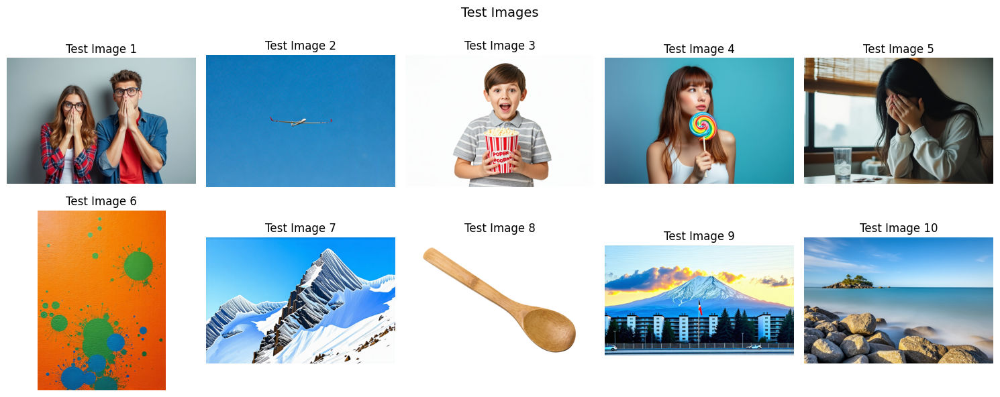

In [ ]:
show_test_images(Comp_test_df, rows=2, cols=5)

# **Splitting Test-Tain Sets**

In [ ]:
comp_train_df["label"] = comp_train_df["label"].map({0: "Human", 1: "AI"})
comp_train_df["label"]

,label
0,AI
1,Human
2,AI
3,Human
4,AI
...,...
79945,Human
79946,AI
79947,Human
79948,AI


In [ ]:
X = comp_train_df.drop(columns="label")
y = comp_train_df["label"]

# Test Split
X_train, X_test, y_train, y_test = train_test_split(X , y,
                                                    test_size=.10,
                                                    stratify=y,
                                                    random_state=0)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(71955, 1)
(71955,)
(7995, 1)
(7995,)


In [ ]:
train_df = pd.concat([X_train,y_train], axis = 1)
train_df

,file_name,label
57211,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
3951,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
58932,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
23607,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
20569,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
...,...,...
16313,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
43517,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
23737,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
71197,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human


In [ ]:
test_df = pd.concat([X_test,y_test], axis = 1)
test_df

,file_name,label
70038,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
68119,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
74486,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
69400,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
72248,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
...,...,...
56716,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
16295,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human
66748,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI
51229,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human


# **Data Preprocessing**

### **Image Data Generatos**

In [ ]:
img_shape = 224

target_shape = 224

color_type = 3

batch_size = 16

In [ ]:
from keras.applications.efficientnet_v2 import preprocess_input
from keras.applications.convnext import preprocess_input

In [ ]:
def Create_Splitted_Data(batch_size, train_data_path, train_df, test_df):

    train_preprocessor = ImageDataGenerator(
        preprocessing_function= preprocess_input,
    )

    test_preprocessor = ImageDataGenerator(
        rescale=1/255.0,
    )

    train_generator = train_preprocessor.flow_from_dataframe(
        dataframe=train_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode='rgb',
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )

    test_generator = test_preprocessor.flow_from_dataframe(
        dataframe=test_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

    return train_generator, test_generator

In [ ]:
train_data, org_test_data = Create_Splitted_Data(batch_size, Dataset_Path, train_df, test_df)

Found 71955 validated image filenames belonging to 2 classes.
Found 7995 validated image filenames belonging to 2 classes.


In [ ]:
print("Number of Train batches:", len(train_data))
print("Number of Test batches:", len(org_test_data))

Number of Train batches: 4498
Number of Test batches: 500


In [ ]:
Classes_Map = train_data.class_indices

Num_Classes = len(Classes_Map)

print("Number of Classes:", Num_Classes)
Classes_Map

Number of Classes: 2


{'Human': 0, 'AI': 1}

# **Data Augmentation**

### **Testing Augmentations**

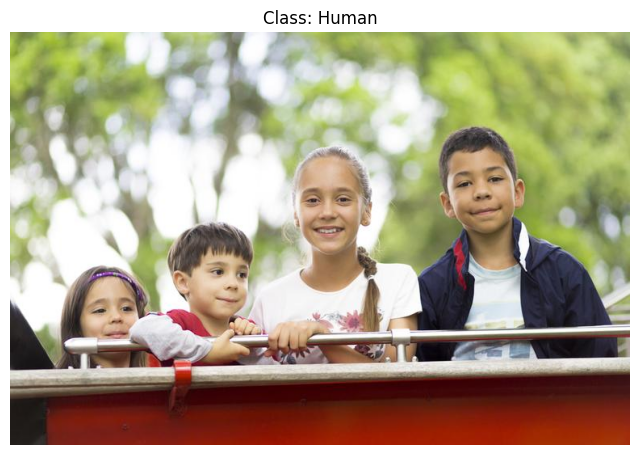

In [ ]:
def show_random_image_from_df(df, train_data_path):
    # Sample a random row from the DataFrame
    random_row = df.sample(1).iloc[0]
    file_name = random_row['file_name']
    label = random_row['label']

    # Construct the full file path
    image_path = os.path.join(train_data_path, file_name)

    # Read and display the image
    image = plt.imread(image_path)

    # Creating a dataset which contains just one image.
    test_augment_image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

    plt.figure(figsize=(8, 6))
    plt.imshow(test_augment_image[0])
    plt.title(f"Class: {label}")
    plt.axis("off")
    plt.show()

    return test_augment_image

Train_Data_Path = Dataset_Path + "train_data/"
Test_Augment_Image = show_random_image_from_df(train_df, Train_Data_Path)

In [ ]:
def plot_augmented_imgdatagenerator_images(data_generator, Img_To_Aug, rows=3, cols=4):
    """
    Plots images generated by an object of the ImageDataGenerator class.
    """
    data_generator.fit(Img_To_Aug)
    image_iterator = data_generator.flow(Img_To_Aug)

    # Create a grid of subplots
    fig, axes = plt.subplots(rows, cols, figsize=(9, 8), subplot_kw={'xticks': [], 'yticks': []})

    # Loop over each axis in the grid
    for ax in axes.flat:
        # Get the next batch of augmented images
        batch = next(image_iterator)
        ax.imshow(batch[0].astype('uint8'))
        ax.axis('off')

    # Set the updated title and adjust the layout
    plt.suptitle("Augmented Images with ImageDataGenerators", fontsize=20, fontweight='bold', y=0.85)
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_augmented_keraslayers_images(augmentation_pipeline, img, rows=3, cols=5):
    """
    Plot augmented versions of an input image using a Keras augmentation pipeline.
    """
    # Ensure the image has a batch dimension
    if img.ndim == 3:
        img = tf.expand_dims(img, axis=0)  # Shape becomes (1, H, W, C)

    total_images = rows * cols

    # Create a grid of subplots
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 3, rows * 3),
                             subplot_kw={'xticks': [], 'yticks': []})
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        # Generate an augmented image
        aug_img = augmentation_pipeline(img, training=True)

        # Remove the batch dimension
        aug_img = tf.squeeze(aug_img, axis=0)

        # Display the image
        ax.imshow(aug_img.numpy().astype('uint8'))
        ax.axis('off')

    # Set the updated title
    plt.suptitle("Augmented Images with Keras Layers", fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Resize then crop to target size
  tf.keras.layers.Resizing(img_shape, img_shape),
  tf.keras.layers.RandomCrop(target_shape, target_shape),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.4,0.6)),                                      # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.Resizing(target_shape, target_shape)                           # Safety net
], name = "augmentation_pipeline")

### **Applying Selected Augmentations**

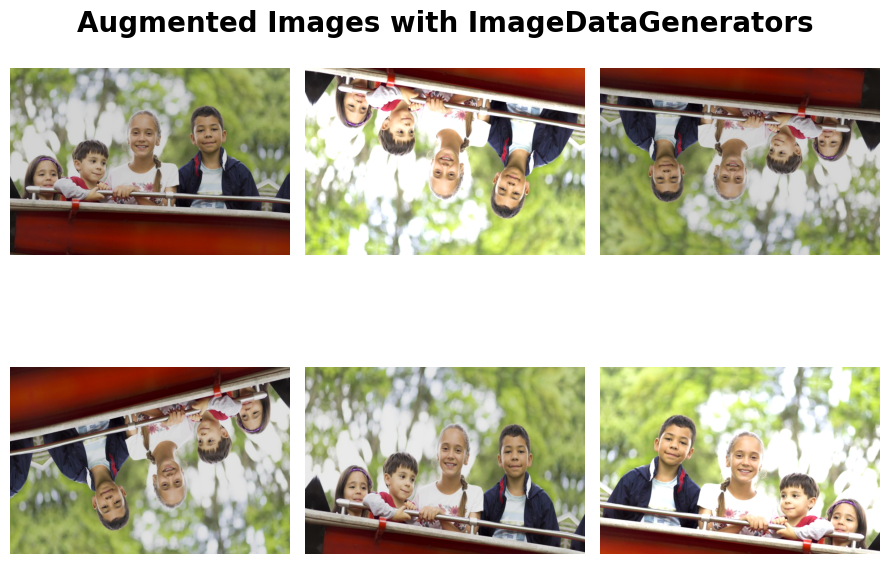

In [ ]:
train_preprocessor = ImageDataGenerator(
                                        zoom_range=(0.9, 1.1),
                                        rotation_range=15,
                                        width_shift_range=0.1,
                                        height_shift_range=0.1,
                                        horizontal_flip=True,
                                        vertical_flip=True,
                                        shear_range=0.1,
                                        brightness_range=[0.8, 1.2],
                                        channel_shift_range=0.2,
                                        fill_mode='reflect',
                                        )

plot_augmented_imgdatagenerator_images(train_preprocessor, Test_Augment_Image, 2, 3)

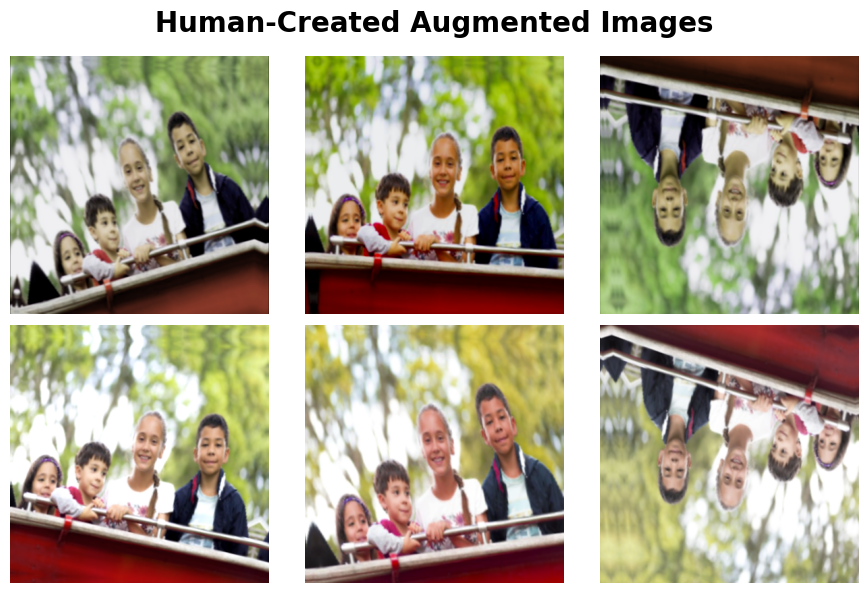

In [ ]:
plot_augmented_keraslayers_images(augmentation_pipeline, Test_Augment_Image, 2, 3)

### **Creating Augmented Data**

In [ ]:
def Create_Aug_Datagens(batch_size, train_data_path, train_df, test_df):

    train_preprocessor = ImageDataGenerator(

        preprocessing_function=preprocess_input,

        zoom_range=(0.9, 1.1),
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        brightness_range=[0.8, 1.2],
        channel_shift_range=0.2,
        fill_mode='reflect',
    )

    train_generator = train_preprocessor.flow_from_dataframe(
        dataframe=train_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape, img_shape),
        color_mode='rgb',
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )

    test_preprocessor = ImageDataGenerator(
        preprocessing_function=preprocess_input,
    )

    test_generator = test_preprocessor.flow_from_dataframe(
        dataframe=test_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

    return train_generator, test_generator

In [ ]:
train_AugData, test_data = Create_Aug_Datagens(batch_size, Dataset_Path, train_df, test_df)

Found 71955 validated image filenames belonging to 2 classes.
Found 7995 validated image filenames belonging to 2 classes.


# **EfficientNetV2B2 Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
from keras.applications.efficientnet_v2 import EfficientNetV2B2

EfficientNetv2b2 = EfficientNetV2B2(input_shape=(target_shape, target_shape, color_type),
              include_top= False,
              weights='imagenet',
              )

# EfficientNetv2b2.summary()

35839040/35839040 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
NoModelLayers = len(EfficientNetv2b2.layers)

print("Number of EfficientNetV2B2 Model Layers: ", NoModelLayers)

Number of EfficientNetV2B2 Model Layers:  349


In [ ]:
# Freezing all layers except last 10

EfficientNetv2b2.trainable = True

Trainable_Layers = 10

for layer in EfficientNetv2b2.layers[ : -Trainable_Layers ]:
    layer.trainable = False

EfficientNetv2b2.summary()

Model: "efficientnetv2-b2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 384, 384,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 384, 384,  │          0 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 192, 192,  │        864 │ normalization[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 192, 192,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 192, 192,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 192, 192,  │      4,608 │ stem_activation[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 192, 192,  │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 192, 192,  │          0 │ block1a_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 192, 192,  │      2,304 │ block1a_project_… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 192, 192,  │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Dropout)           │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 192, 192,  │          0 │ block1b_drop[0][… │
│                     │ 16)               │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 96, 96,    │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 96, 96,    │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 96, 96,    │          0 │ block2a_expand_b

 Total params: 8,769,374 (33.45 MB)

 Trainable params: 686,772 (2.62 MB)

 Non-trainable params: 8,082,602 (30.83 MB)

### **Model Architecture**

In [ ]:
def Create_EfficientNetV2B2_Model():

  model = Sequential([
                      EfficientNetv2b2,

                      BatchNormalization(),

                      ###########################################

                      GlobalAveragePooling2D(),

                      ###########################################

                      Dense(256, kernel_initializer="he_normal", activation = 'relu', kernel_regularizer=regularizers.L1L2(0.001)),
                      Dropout(0.3),

                      Dense(128, kernel_initializer="he_normal", activation = 'relu', kernel_regularizer=regularizers.L1L2(0.001)),
                      Dropout(0.5),

                      ###########################################

                      Dense(1, activation = "sigmoid", kernel_initializer="GlorotUniform")
                    ])
  return model

In [ ]:
EfficientNetV2B2_Model = Create_EfficientNetV2B2_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

EfficientNetV2B2_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha, beta), metrics=['accuracy'])

EfficientNetV2B2_Model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-b2 (Functional)  │ (None, 12, 12, 1408)   │     8,769,374 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 12, 12, 1408)   │         5,632 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       360,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,168,735 (34.98 MB)

 Trainable params: 1,083,317 (4.13 MB)

 Non-trainable params: 8,085,418 (30.84 MB)

### **Specifying Callbacks**

In [ ]:
# plot_model(EfficientNetV2B2_Model,"EfficientNetV2B2_Model.png", show_shapes=True, show_layer_names=True)

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting EfficientNetV2B2 Model**

In [ ]:
EfficientNetV2B2_history = EfficientNetV2B2_Model.fit(train_AugData,
                                            validation_data = test_data, epochs=3,
                                            batch_size=batch_size,
                                            callbacks = callbacks)

Epoch 1/3
4498/4498 ━━━━━━━━━━━━━━━━━━━━ 1447s 318ms/step - accuracy: 0.7959 - loss: 7.3326 - val_accuracy: 0.9192 - val_loss: 0.5227 - learning_rate: 1.0000e-04
Epoch 2/3
4498/4498 ━━━━━━━━━━━━━━━━━━━━ 1423s 309ms/step - accuracy: 0.9001 - loss: 0.4716 - val_accuracy: 0.9413 - val_loss: 0.3088 - learning_rate: 1.0000e-04
Epoch 3/3
4498/4498 ━━━━━━━━━━━━━━━━━━━━ 1403s 310ms/step - accuracy: 0.9153 - loss: 0.3517 - val_accuracy: 0.9410 - val_loss: 0.2781 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 3.


In [ ]:
EfficientNetV2B2_Scores = EfficientNetV2B2_Model.evaluate(test_data)

print("    Test Loss: {:.5f}".format(EfficientNetV2B2_Scores[0]))
print("Test Accuracy: {:.2f}%".format(EfficientNetV2B2_Scores[1] * 100))

500/500 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - accuracy: 0.9419 - loss: 0.2762
    Test Loss: 0.27809
Test Accuracy: 94.10%


### **Evaluating Model**

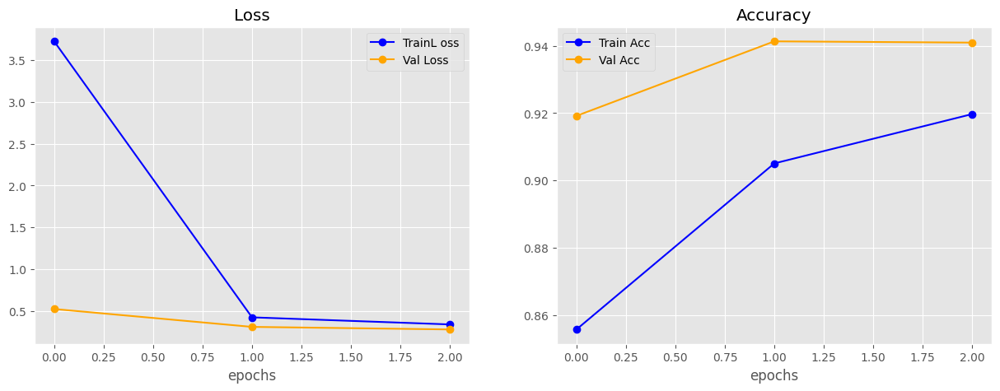

In [ ]:
plot_history_curves(EfficientNetV2B2_history)

**Predicting Test Set**

In [ ]:
EfficientNetV2B2_Test_Predictions_Probs = EfficientNetV2B2_Model.predict(test_data)

decisionThreshold = 0.5

EfficientNetV2B2_Test_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetV2B2_Test_Predictions_Probs]

EfficientNetV2B2_Test_Predictions[:5]

500/500 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step


[1, 0, 0, 1, 1]

[Metrics Summary]
Accuracy = 94.10% | Balanced Accuracy = 94.10% | Precision = 94.35% | Recall = 94.10% | F1-Score = 94.09% | F-Beta Score = 94.06% | AUC Score = 99.03% | Average Precision = 99.06%


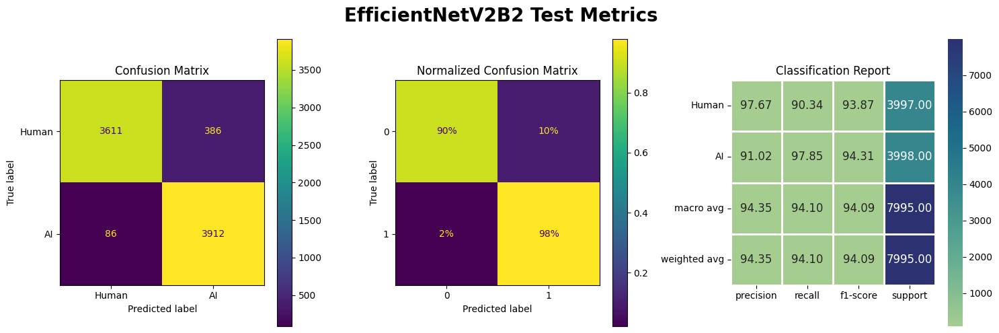


 EfficientNetV2B2 Test Classification Report: 
               precision    recall  f1-score   support

       Human       0.98      0.90      0.94      3997
          AI       0.91      0.98      0.94      3998

    accuracy                           0.94      7995
   macro avg       0.94      0.94      0.94      7995
weighted avg       0.94      0.94      0.94      7995



In [ ]:
make_classification_plots(test_data.labels, EfficientNetV2B2_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2B2 Test")

[Positive Class Metrics Summary]
Precision = 91.02% | Recall = 97.85% | F1-Score = 94.31% | F-Beta Score = 96.40% | AUC Micro Score = 99.03%


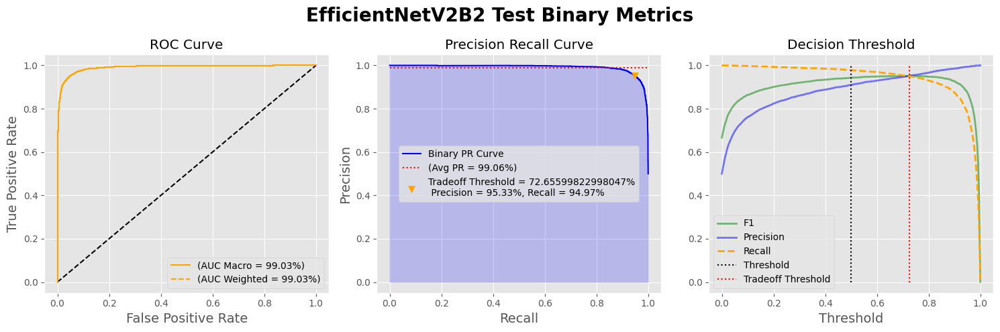

In [ ]:
EfficientNetV2B2_Test_Best_Threshold = make_binary_classification_plots(
    test_data.labels, EfficientNetV2B2_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2B2 Test")

,samples,micro,macro,weighted
AUC,99.030000,99.030000,99.030000,99.030000
mAP,99.060000,99.060000,99.060000,99.060000


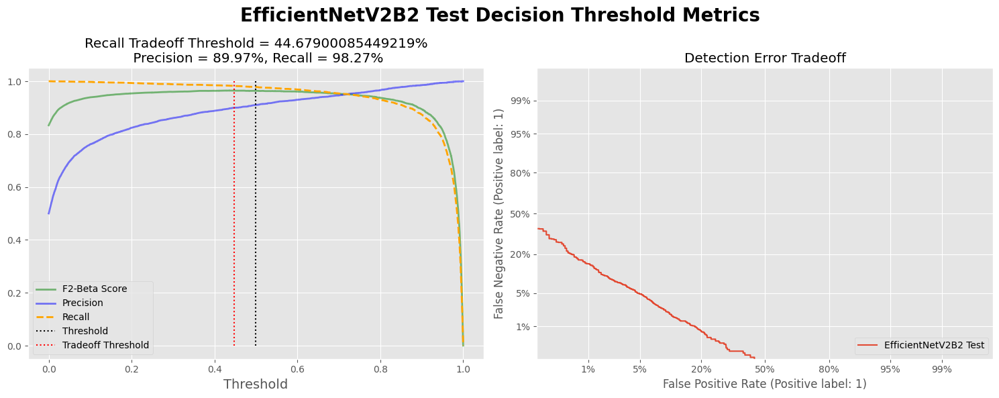

In [ ]:
EfficientNetV2B2_Test_BestRecall_Threshold = make_binary_threshold_plots(
    test_data.labels, EfficientNetV2B2_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2B2 Test")

# **EfficientNetV2S Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
from keras.applications.efficientnet_v2 import EfficientNetV2S

EfficientNetv2s = EfficientNetV2S(input_shape=(target_shape, target_shape, color_type),
              include_top= False,
              weights='imagenet',
              )

EfficientNetv2s.summary()

82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "efficientnetv2-s"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 384, 384,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 192, 192,  │        648 │ rescaling_1[0][0] │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 192, 192,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 192, 192,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 192, 192,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 192, 192,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 192, 192,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 192, 192,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 192, 192,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 192, 192,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 192, 192,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 96, 96,    │     20,736 │ block1b_add[0][0] │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 96, 96,    │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 96, 96,    │          0 │ block2a_expand_b

 Total params: 20,331,360 (77.56 MB)

 Trainable params: 20,177,488 (76.97 MB)

 Non-trainable params: 153,872 (601.06 KB)

In [ ]:
NoModelLayers = len(EfficientNetv2s.layers)

print("Number of EfficientNetV2S Model Layers: ", NoModelLayers)

Number of EfficientNetV2S Model Layers:  513


### **Model Architecture**

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Resize then crop to target size
  tf.keras.layers.Resizing(img_shape, img_shape),
  tf.keras.layers.RandomCrop(target_shape, target_shape),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.4,0.6)),                                      # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.Resizing(target_shape, target_shape)                           # Safety net
], name = "augmentation_pipeline")

In [ ]:
def Create_EfficientNetV2S_Model(input_shape=(img_shape, img_shape, color_type)):

    inputs = Input(shape=input_shape)

    # Apply augmentation
    x = augmentation_pipeline(inputs)

    efficientnet_base = EfficientNetV2S(include_top=False, weights="imagenet", input_shape=(target_shape, target_shape, color_type))

    # Freezing Specific Percentage of Network Layers
    Freezing_Percentage = 0.05

    efficientnet_base.trainable = True

    for layer in efficientnet_base.layers[:-int(NoModelLayers * Freezing_Percentage)]:
        layer.trainable = False


    # Pass through the efficientnet base model.
    x = efficientnet_base(x)

    # Optionally add a BatchNormalization layer.
    x = BatchNormalization()(x)

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Dense head
    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.3)(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.3)(x)

    x = Dense(128, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.5)(x)

    # Final classifier for binary classification.
    outputs = Dense(1, activation="sigmoid", kernel_initializer="GlorotUniform")(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
EfficientNetV2S_Model = Create_EfficientNetV2S_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

EfficientNetV2S_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha, beta), metrics=['accuracy'])

EfficientNetV2S_Model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation_pipeline           │ (None, 384, 384, 3)    │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 12, 12, 1280)   │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 12, 12, 1280)   │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,156,705 (80.71 MB)

 Trainable params: 2,750,081 (10.49 MB)

 Non-trainable params: 18,406,624 (70.22 MB)

### **Specifying Callbacks**

In [ ]:
# plot_model(EfficientNetV2S_Model,"EfficientNetV2S_Model.png", show_shapes=True, show_layer_names=True)

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting EfficientNetV2S Model**

In [ ]:
EfficientNetV2S_history = EfficientNetV2S_Model.fit(train_AugData,
                                            validation_data = test_data, epochs=5,
                                            batch_size=batch_size,
                                            callbacks = callbacks)

In [ ]:
EfficientNetV2S_Scores = EfficientNetV2S_Model.evaluate(test_data)

print("    Test Loss: {:.5f}".format(EfficientNetV2S_Scores[0]))
print("Test Accuracy: {:.2f}%".format(EfficientNetV2S_Scores[1] * 100))

### **Evaluating Model**

In [ ]:
plot_history_curves(EfficientNetV2S_history)

**Predicting Test Set**

In [ ]:
EfficientNetV2S_Test_Predictions_Probs = EfficientNetV2S_Model.predict(test_data)

decisionThreshold = 0.5

EfficientNetV2S_Test_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetV2S_Test_Predictions_Probs]

EfficientNetV2S_Test_Predictions[:5]

In [ ]:
make_classification_plots(test_data.labels, EfficientNetV2S_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2S Test")

In [ ]:
EfficientNetV2S_Test_Best_Threshold = make_binary_classification_plots(
    test_data.labels, EfficientNetV2S_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2S Test")

In [ ]:
EfficientNetV2S_Test_BestRecall_Threshold = make_binary_threshold_plots(
    test_data.labels, EfficientNetV2S_Test_Predictions_Probs, decisionThreshold, "EfficientNetV2S Test")

# **ConNeXt Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
from keras.applications.convnext import ConvNeXtTiny

ConvNeXt = ConvNeXtTiny(input_shape=(target_shape, target_shape, color_type),
              include_top= False,
              weights='imagenet',
              )

ConvNeXt.summary()

111650432/111650432 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "convnext_tiny"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_pres… │ (None, 384, 384,  │          0 │ input_layer_7[0]… │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stem  │ (None, 96, 96,    │      4,896 │ convnext_tiny_pr… │
│ (Sequential)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │      4,800 │ convnext_tiny_st… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │         96 │ convnext_tiny_st… │
│ (LayerScale)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 96, 96,    │          0 │ convnext_tiny_st… │
│                     │ 96)               │            │ convnext_tiny_st… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │      4,800 │ add[0][0]         │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │        192 │ convnext_tiny_st… │
│ (LayerNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │     37,248 │ convnext_tiny_st… │
│ (Dense)             │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │          0 │ convnext_tiny_st… │
│ (Activation)        │ 384)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │     36,960 │ convnext_tiny_st… │
│ (Dense)             │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ convnext_tiny_stag… │ (None, 96, 96,    │         96 │ convnext_tiny_st

 Total params: 27,820,128 (106.13 MB)

 Trainable params: 27,820,128 (106.13 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
NoModelLayers = len(ConvNeXt.layers)

print("Number of ConvNeXt Model Layers: ", NoModelLayers)

Number of ConvNeXt Model Layers:  133


### **Model Architecture**

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Resize then crop to target size
  tf.keras.layers.Resizing(img_shape, img_shape),
  tf.keras.layers.RandomCrop(target_shape, target_shape),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.4,0.6)),                                      # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.Resizing(target_shape, target_shape)                           # Safety net
], name = "augmentation_pipeline")

In [ ]:
def Create_ConvNeXt_Model(input_shape=(img_shape, img_shape, color_type)):

    inputs = Input(shape=input_shape)

    # Apply augmentation
    x = augmentation_pipeline(inputs)

    convnext_base = ConvNeXtTiny(include_top=False, weights="imagenet", input_shape=(target_shape, target_shape, color_type))

    # Freezing Specific Percentage of Network Layers
    Freezing_Percentage = 0.04

    convnext_base.trainable = True

    for layer in convnext_base.layers[:-int(NoModelLayers * Freezing_Percentage)]:
        layer.trainable = False


    # Pass through the convnext base model.
    x = convnext_base(x)

    # Optionally add a BatchNormalization layer.
    x = BatchNormalization()(x)

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Dense head

    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.3)(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.3)(x)

    x = Dense(128, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.001))(x)
    x = Dropout(0.5)(x)

    # Final classifier for binary classification.
    outputs = Dense(1, activation="sigmoid", kernel_initializer="GlorotUniform")(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
ConvNeXt_Model = Create_ConvNeXt_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

ConvNeXt_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha, beta), metrics=['accuracy'])

ConvNeXt_Model.summary()

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_34 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation_pipeline           │ (None, 384, 384, 3)    │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convnext_tiny (Functional)      │ (None, 12, 12, 768)    │    27,820,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 12, 12, 768)    │         3,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 768)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 512)            │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,381,281 (108.27 MB)

 Trainable params: 2,921,985 (11.15 MB)

 Non-trainable params: 25,459,296 (97.12 MB)

### **Specifying Callbacks**

In [ ]:
# plot_model(ConvNeXt_Model,"ConvNeXt_Model.png", show_shapes=True, show_layer_names=True)

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting ConvNeXt Model**

In [ ]:
ConvNeXt_history = ConvNeXt_Model.fit(train_AugData,
                                            validation_data = test_data, epochs=5,
                                            batch_size=batch_size,
                                            callbacks = callbacks)

In [ ]:
ConvNeXt_Scores = ConvNeXt_Model.evaluate(test_data)

print("    Test Loss: {:.5f}".format(ConvNeXt_Scores[0]))
print("Test Accuracy: {:.2f}%".format(ConvNeXt_Scores[1] * 100))

### **Evaluating ConvNeXt Model**

In [ ]:
plot_history_curves(ConvNeXt_history)

**Predicting Test Set**

In [ ]:
ConvNeXt_Test_Predictions_Probs = ConvNeXt_Model.predict(test_data)

decisionThreshold = 0.5

ConvNeXt_Test_Predictions = [1 if pred > decisionThreshold else 0 for pred in ConvNeXt_Test_Predictions_Probs]

ConvNeXt_Test_Predictions[:5]

In [ ]:
make_classification_plots(test_data.labels, ConvNeXt_Test_Predictions_Probs, decisionThreshold, "ConvNeXt Test")

In [ ]:
ConvNeXt_Test_Best_Threshold = make_binary_classification_plots(
    test_data.labels, ConvNeXt_Test_Predictions_Probs, decisionThreshold, "ConvNeXt Test")

In [ ]:
ConvNeXt_Test_BestRecall_Threshold = make_binary_threshold_plots(
    test_data.labels, ConvNeXt_Test_Predictions_Probs, decisionThreshold, "ConvNeXt Test")

# **Visualizing Predictions**

In [ ]:
test_preprocessor = ImageDataGenerator(
        preprocessing_function= preprocess_input,
    )

test_generator = test_preprocessor.flow_from_dataframe(
        dataframe=test_df,
        directory=Dataset_Path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )

Found 15990 validated image filenames belonging to 2 classes.


## **Model Predictions**

Image 1 predictions: {'Human': '9.26', 'AI': '90.74'} | Inference Time: 110.94ms
Image 2 predictions: {'Human': '96.95', 'AI': '3.05'} | Inference Time: 84.87ms
Image 3 predictions: {'Human': '65.34', 'AI': '34.66'} | Inference Time: 80.37ms
Image 4 predictions: {'Human': '96.74', 'AI': '3.26'} | Inference Time: 85.78ms
Image 5 predictions: {'Human': '1.45', 'AI': '98.55'} | Inference Time: 89.45ms
Image 6 predictions: {'Human': '98.18', 'AI': '1.82'} | Inference Time: 80.28ms
Image 7 predictions: {'Human': '0.46', 'AI': '99.54'} | Inference Time: 86.95ms
Image 8 predictions: {'Human': '3.04', 'AI': '96.96'} | Inference Time: 81.31ms
Image 9 predictions: {'Human': '3.34', 'AI': '96.66'} | Inference Time: 79.81ms
Image 10 predictions: {'Human': '45.17', 'AI': '54.83'} | Inference Time: 80.65ms


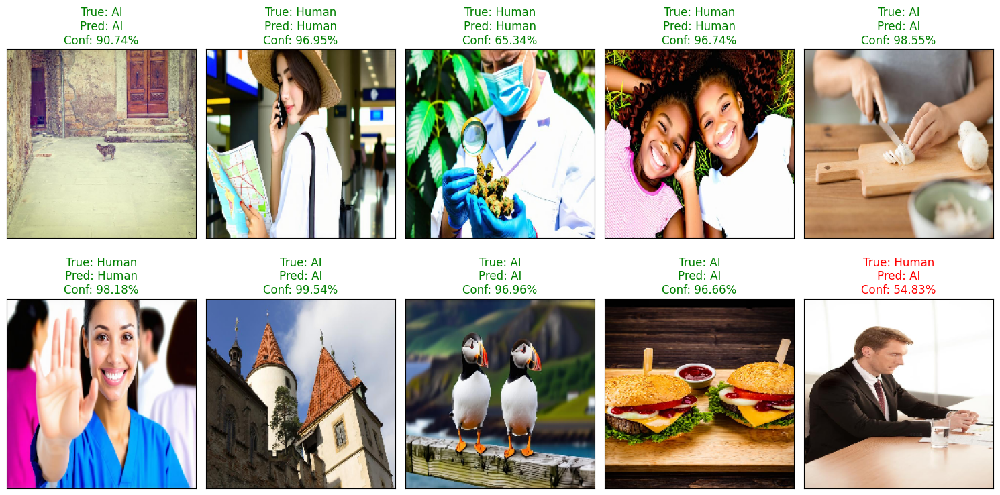


Total inference time for 10 images: 0.86 seconds.

Average inference time for 10 images: 0.09 seconds (86.04ms).


In [ ]:
display_random_predictions(test_generator, org_test_data, EfficientNetV2B2_Model, Classes_Labels,  rows=2, cols=5)

# **Predicting Competition Test Data**

In [ ]:
Comp_test_df

,id,file_path
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
...,...,...
5535,test_data_v2/483412064ff74d9d9472d606b65976d9.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5536,test_data_v2/c0b49ba4081a4197b422dac7c15aea7f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5537,test_data_v2/01454aaedec140c0a3ca1f48028c41cf.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5538,test_data_v2/e9adfea8b67e4791968c4c2bdd8ec343.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...


In [ ]:
comp_test_preprocessor = ImageDataGenerator(
        preprocessing_function=preprocess_input,
    )

comp_test_generator = comp_test_preprocessor.flow_from_dataframe(
        dataframe=Comp_test_df,
        directory=Dataset_Path,
        x_col="file_path",
        y_col=None,
        class_mode=None,
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

Found 5540 validated image filenames.


**Predicting Competition Test Data**

In [ ]:
Predictions_Probs = EfficientNetV2B2_Model.predict(comp_test_generator)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


347/347 ━━━━━━━━━━━━━━━━━━━━ 225s 642ms/step


In [ ]:
decisionThreshold = 0.10

CompTest_Predictions = [1 if pred > decisionThreshold else 0 for pred in Predictions_Probs]

CompTest_Predictions[:5]

[1, 1, 0, 0, 0]

In [ ]:
len(CompTest_Predictions)

5540

**Making Submission**

In [ ]:
submission_df = pd.DataFrame({
    'id': Comp_test_df['id'],
    'label': CompTest_Predictions
})

submission_df.to_csv('submission.csv', index=False)

print(submission_df.head())

                                                  id  label
0  test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg      1
1  test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg      1
2  test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg      0
3  test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg      0
4  test_data_v2/a16495c578b7494683805484ca27cf9f.jpg      0


In [ ]:
submission_df['label'].value_counts()

,count
label,
1,3104
0,2436


In [ ]:
from google.colab import files
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
EfficientNetV2B2_Model.save('EfficientNetB2V2.h5')